# Generative AI Challenge: Character Consistency

Name: Daan Quaadvliet

Number: 231146

These are the libraries used

In [2]:
import base64
from ollama import Client
import requests
import uuid
import json
import urllib
import random
import io
import websocket
import os
import base64
from IPython.display import Image, display

## 1. Solution Overview

This notebook aims to solve the challenge of maintaining character consistency in AI-generated images across multiple scenes. To achieve this, we will:

1. Load and Enhance Scene Descriptions Using Ollama:

* We start by fetching a random story with multiple scenes. Using the Ollama API, we refine each scene description by adding detailed character attributes and setting elements, ensuring consistency in the character’s appearance (e.g., hairstyle, clothing) across all scenes.

2. Generate Consistent Images with ComfyUI:

* With the enhanced scene descriptions from Ollama, we input each refined prompt into ComfyUI for image generation. ComfyUI is configured to load specific models and parameters to maintain a consistent style and character look.
* By setting consistent generation parameters (e.g., fixed seed values), we further control variations across scenes to achieve a cohesive visual narrative.

This approach leverages Ollama’s language model to improve textual descriptions and ComfyUI’s image generation capabilities to produce a sequence of images that depict the same character with consistent features throughout various scenes.



## 2. Load Story

We start by loading a story. The code below loads a random story from the server and stores the scene descritions in the ``story_scenes`` list. 

Every time you run this code, you will get a different story. Your solution must work with any story given by the server.

In [3]:
response = requests.get("https://edirlei.com/buas/get-story.php")
story_scenes = response.json()
    
for i in range(len(story_scenes)):
    print("SCENE " + str(i + 1) + ": " + story_scenes[i])

SCENE 1: Jake sprints through an abandoned street, gripping a bloodied baseball bat. His torn jacket flaps as he glances back at the horde of zombies shuffling behind him.
SCENE 2: Jake barricades a door inside an empty diner, pushing tables and chairs against it. His bat rests beside him as he catches his breath, sweat dripping down his face.
SCENE 3: Inside the dark diner, Jake peers out the window. His jacket is now tied around his waist, and he grips the bat tightly as zombies gather outside, their groans echoing in the distance.
SCENE 4: Jake moves cautiously through the kitchen, picking up a flashlight. His bat is slung over his shoulder, and the flickering light casts shadows on the rusted metal walls.
SCENE 5: Suddenly, a zombie lunges at Jake from the shadows. He swings his bat, smashing the creature aside. His face is determined, but fear flickers in his eyes.
SCENE 6: Jake runs through the back alley, the bat still in hand. His jacket is gone now, and his shirt is ripped as 

## 3. Preprocess Scene Descriptions

These preprocessing steps will allow us to enhance the story. right now if we put this story above in the ui, it will fail, because there is no consistency in the story. this will make it hard to make the story align in the pictures itself and will make different characters.

To fix this we will use ollama to rewrite the story a little bit. this will add characteristics to the characters, so it will make more consitstent image generation.

This code makes a prompt for the ollama model. This prompt is the message we send to the Ollama language model to refine each scene description. The prompt instructs Ollama to enhance each scene by adding detailed physical characteristics for the character, ensuring consistency across scenes. This helps maintain a uniform portrayal of the character’s appearance and clothing.

In [29]:
prompt_1 = "improve the provided scene description by adding the physical characteristics of person mentioned in the scene. Make the physical characteristics consistent (brown hair, blue eyes, tall and athletic) through the scenes. Also make the clothing consistent (blue leather jacket, white shirt under it, blue jeans) throughout the scenes. Write only the final scene description in a concise way without adding any commentary or header. Here is the scene: "

This codesection sets up the credentials and model details to connect to the Ollama API. This configuration allows us to authenticate with the Ollama server and specify the model for refining scene descriptions.

In [12]:
ollama_server_address = "buas9.edirlei.com"
ollama_username = "adsai"
ollama_password = "uuUP4whjX29cF3cxwrX3SY5Mm9TmtASkdgpaNCTHZ9"
ollama_credentials = base64.b64encode(f"{ollama_username}:{ollama_password}".encode('utf-8')).decode('utf-8')
ollama_auth_header = f"Basic {ollama_credentials}"
ollama_llm_model = "llama3.1:8b"

This line creates an instance of the Client class for the Ollama API. This client instance allows us to send requests to the Ollama server and interact with the Llama model. It uses the server address and authorization header set up earlier.

In [13]:
ollama_client = Client(host=f"http://{ollama_server_address}", headers = {"Authorization": ollama_auth_header})

This loop sends each scene description to the Llama model, which refines it by adding consistent character details. The enhanced scenes are then saved to story_1_improved for later use.

In [30]:
story_1_improved = []

for i in range(len(story_scenes)):
    response = ollama_client.chat(model=ollama_llm_model, messages=[
        {
            "role": "user",
            "content": prompt_1 + story_scenes[i],
        },
    ])
    story_1_improved.append(response["message"]["content"])

This step allows you to verify that Ollama has enhanced the descriptions, adding detailed and consistent character features across scenes.

In [31]:
for i in range(len(story_1_improved)):
    print("IMPROVED SCENE " + str(i + 1) + ": " + story_1_improved[i])

IMPROVED SCENE 1: He's tall and athletic, with broad shoulders that strain against his blue leather jacket, which now hangs in tattered threads from the ripped sleeves. A white shirt peeks out from under the jacket, its collar smeared with dirt and sweat. His brown hair sticks to his forehead, framing a face set in a grim expression. Blue eyes gleam beneath thick eyebrows as he pumps his arms and legs, his blue jeans clinging to his muscular thighs. The baseball bat in his hands is slick with blood and grime, a gruesome testament to the chaos that's unfolded behind him.
IMPROVED SCENE 2: He stands tall, about six feet one inch with a lean yet athletic build, and his brown hair sticks to his forehead in sweat-drenched strands. His bright blue eyes scan the diner's interior, locking onto the barricaded door. He wears the same worn-out look as before, but now his face is streaked with sweat and a few days' worth of stubble has begun to show. The blue leather jacket, a white shirt undernea

This is an additional display function that prints each improved scene for easy review. Shows the final enhanced descriptions in a structured format, allowing you to check for consistency before using them for image generation.

In [32]:
# Display the processed scenes
for i, scene in enumerate(story_1_improved, start=1):
    print(f"Processed SCENE {i}: {scene}")

Processed SCENE 1: He's tall and athletic, with broad shoulders that strain against his blue leather jacket, which now hangs in tattered threads from the ripped sleeves. A white shirt peeks out from under the jacket, its collar smeared with dirt and sweat. His brown hair sticks to his forehead, framing a face set in a grim expression. Blue eyes gleam beneath thick eyebrows as he pumps his arms and legs, his blue jeans clinging to his muscular thighs. The baseball bat in his hands is slick with blood and grime, a gruesome testament to the chaos that's unfolded behind him.
Processed SCENE 2: He stands tall, about six feet one inch with a lean yet athletic build, and his brown hair sticks to his forehead in sweat-drenched strands. His bright blue eyes scan the diner's interior, locking onto the barricaded door. He wears the same worn-out look as before, but now his face is streaked with sweat and a few days' worth of stubble has begun to show. The blue leather jacket, a white shirt undern

## 4. Image Generation with Improved Character Consistency

To understand how this code works, i did research on how every part worked:

part 1, Set Up ComfyUI Configuration
* First Define the server address, workflow file path, client ID, username, and password for accessing the ComfyUI server.
* Encode credentials into a header for secure authentication.

part 2, Define Helper Functions
* comfyui_queue_prompt: Sends a prompt to the ComfyUI server to initiate an image generation request.
* comfyui_get_image: Downloads a specific image from the server based on its filename, folder, and type.
* comfyui_get_history: Retrieves generation history for a specific prompt ID, useful for tracking.
* comfyui_get_images: Retrieves all images related to a specific prompt by establishing a WebSocket connection and downloading generated images.

part 3, Define the Image Generation Function
* comfyui_generate_image_juggernaut_xl: Reads the workflow file, updates it with the prompt, negative prompt, and seed.
* Connects to ComfyUI via WebSocket, runs the workflow, and saves the generated image.

part 4, Generate and Display Images for Each Scene
* Loop through each enhanced scene description, generate an image using comfyui_generate_image_juggernaut_xl, and save the images.
* Display each image with its corresponding scene description to verify consistency.

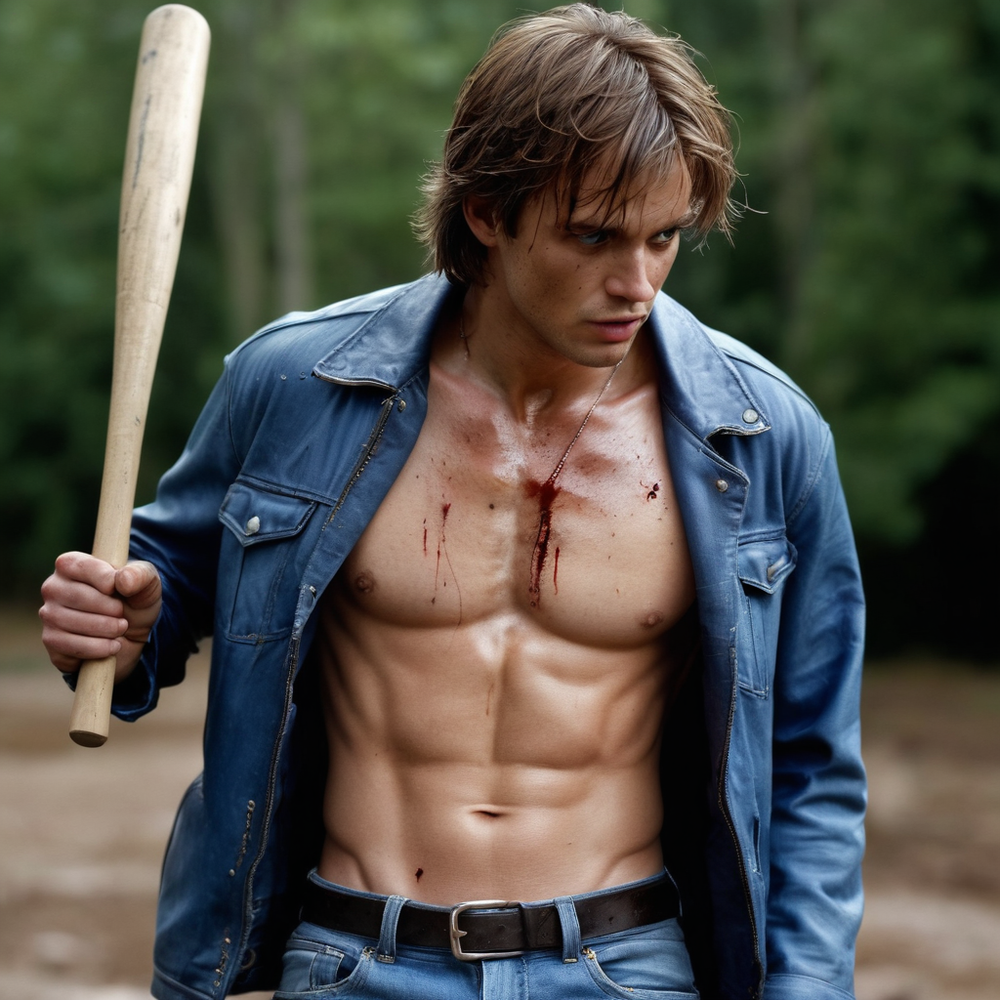

He's tall and athletic, with broad shoulders that strain against his blue leather jacket, which now hangs in tattered threads from the ripped sleeves. A white shirt peeks out from under the jacket, its collar smeared with dirt and sweat. His brown hair sticks to his forehead, framing a face set in a grim expression. Blue eyes gleam beneath thick eyebrows as he pumps his arms and legs, his blue jeans clinging to his muscular thighs. The baseball bat in his hands is slick with blood and grime, a gruesome testament to the chaos that's unfolded behind him.


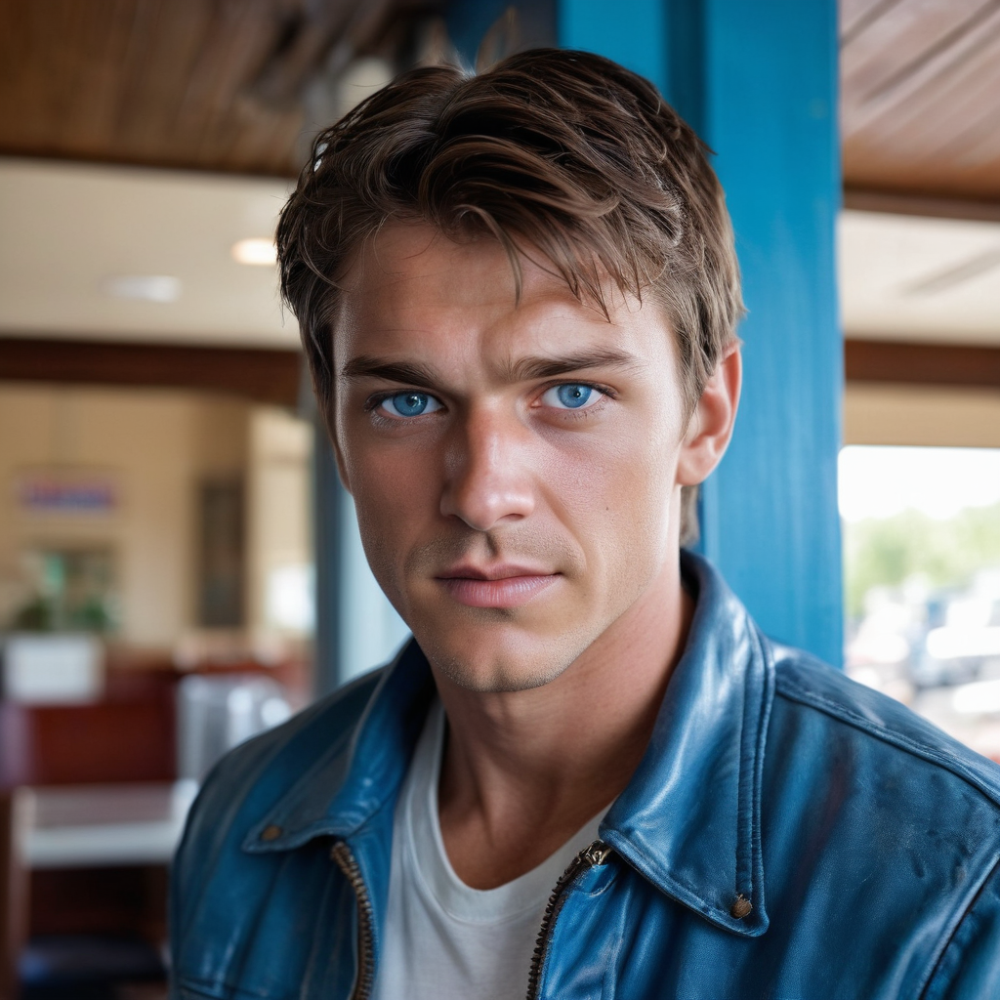

He stands tall, about six feet one inch with a lean yet athletic build, and his brown hair sticks to his forehead in sweat-drenched strands. His bright blue eyes scan the diner's interior, locking onto the barricaded door. He wears the same worn-out look as before, but now his face is streaked with sweat and a few days' worth of stubble has begun to show. The blue leather jacket, a white shirt underneath it, and a pair of well-worn blue jeans are all still intact, though slightly disheveled from his earlier exertions.


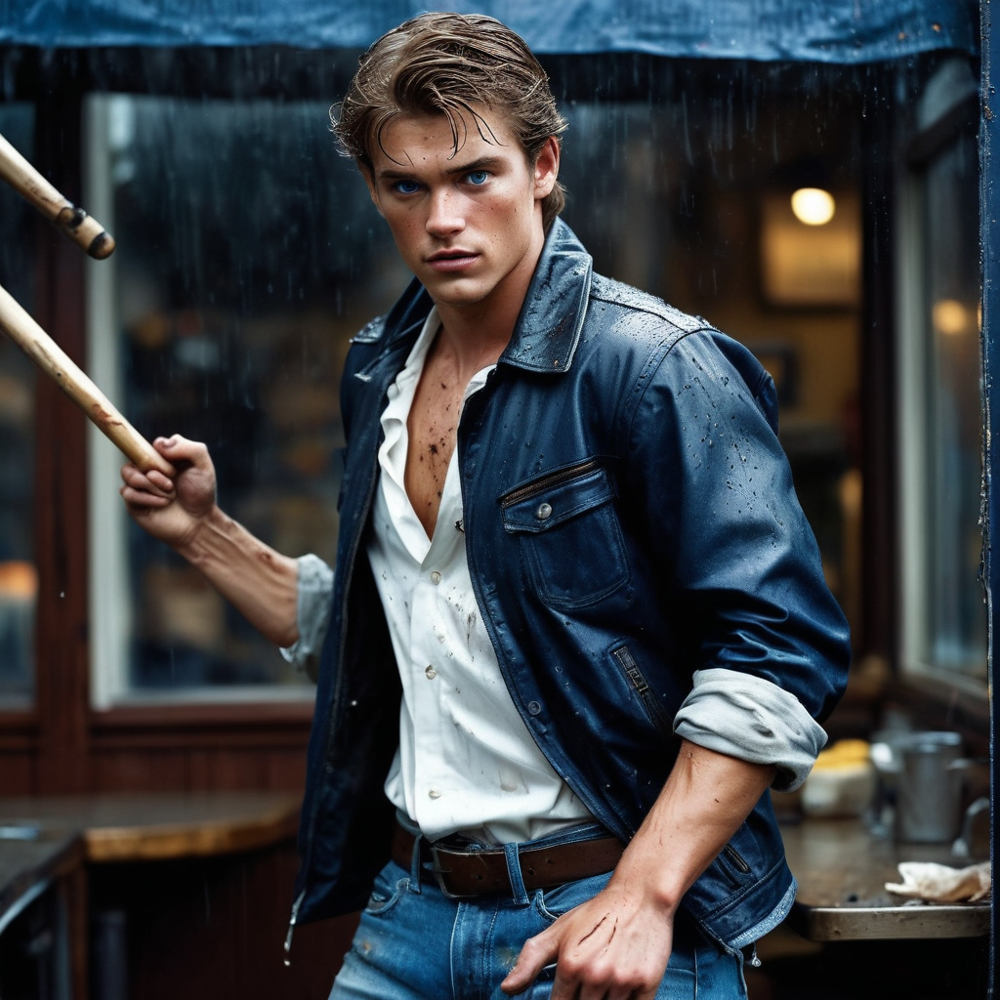

Brown-haired Jake stands tall at 6'2", his athletic build evident even in the dim light of the diner, as he gazes out the window through the rain-splattered glass. His blue eyes scan the streets, a look of determination etched on his face beneath the brown stubble that's starting to grow. He's shed his blue leather jacket, now tied loosely around his waist, and his white shirt clings to his torso as he grips the baseball bat tightly in one hand, his fingers wrapped around it like a vice. His dark blue jeans are splattered with mud and dirt, a testament to his earlier escapades.


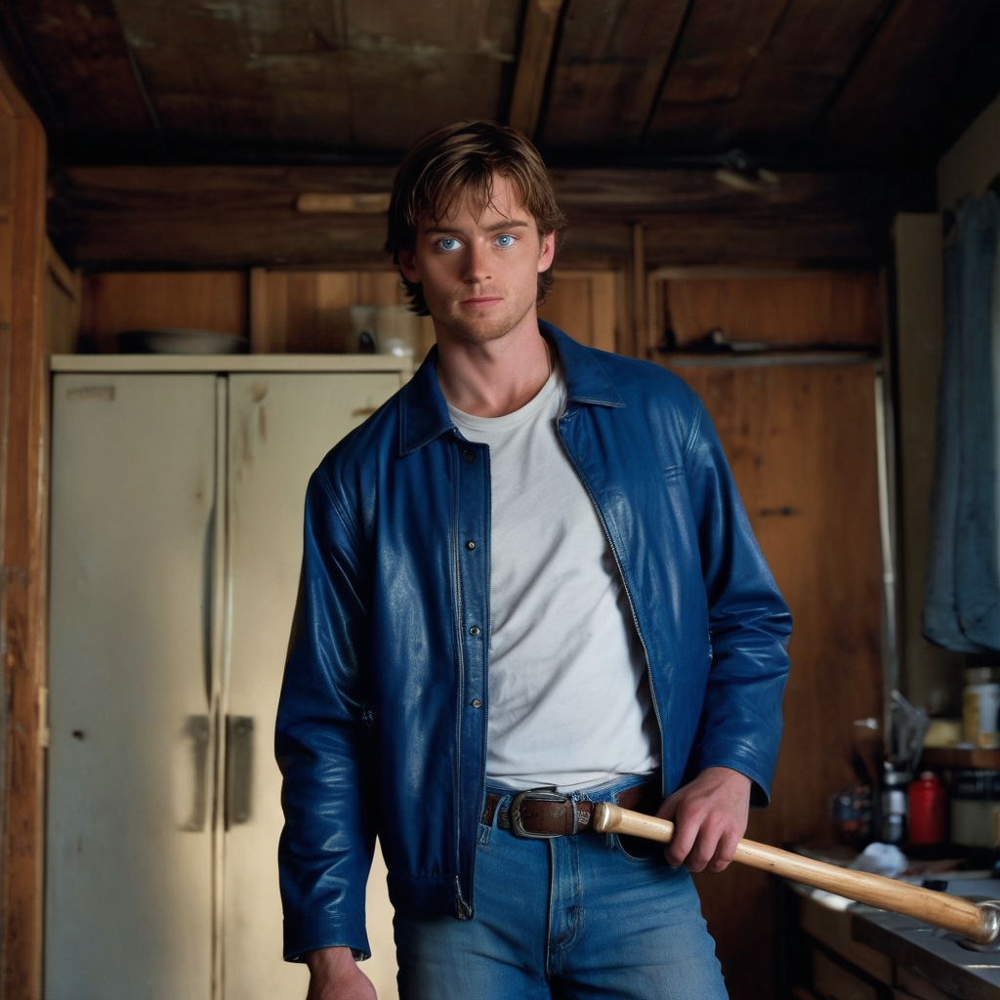

Jake moves cautiously through the kitchen, his 6'2" frame towering above the counter as he picks up a flashlight from its hook. The bright blue leather jacket that covers his athletic build seems to shimmer in the dim light, and the white shirt underneath catches a glimpse of blue beneath the sleeve. His blue jeans are worn but clean, despite the dusty air. His brown hair is mussed, and his piercing blue eyes scan the room as he slings his baseball bat over one shoulder, its wooden length creaking slightly in the stillness. The flickering light casts sharp shadows on the rusted metal walls, accentuating Jake's rugged features.


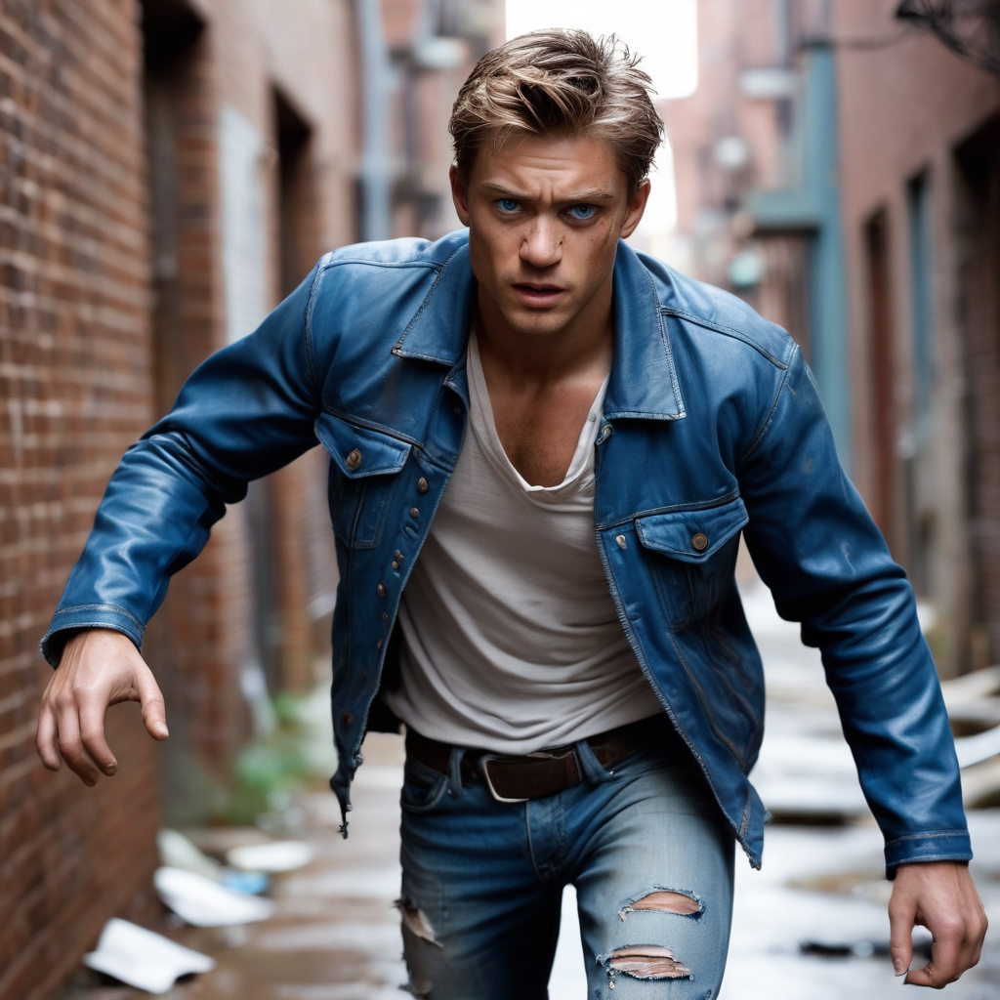

Jake's tall and athletic physique allows him to swing his bat with ease, sending the zombie flying across the alleyway. His brown hair is disheveled, sticking out from under his blue leather jacket, which is slightly torn at the shoulder, revealing a white shirt underneath. A few strands of sweat-dampened hair fall onto his forehead as he takes a step back, his bright blue eyes scanning the surrounding area for any more threats. His worn jeans are dusty and ripped in a few places, but he doesn't seem to notice as he readies himself for the next attack.


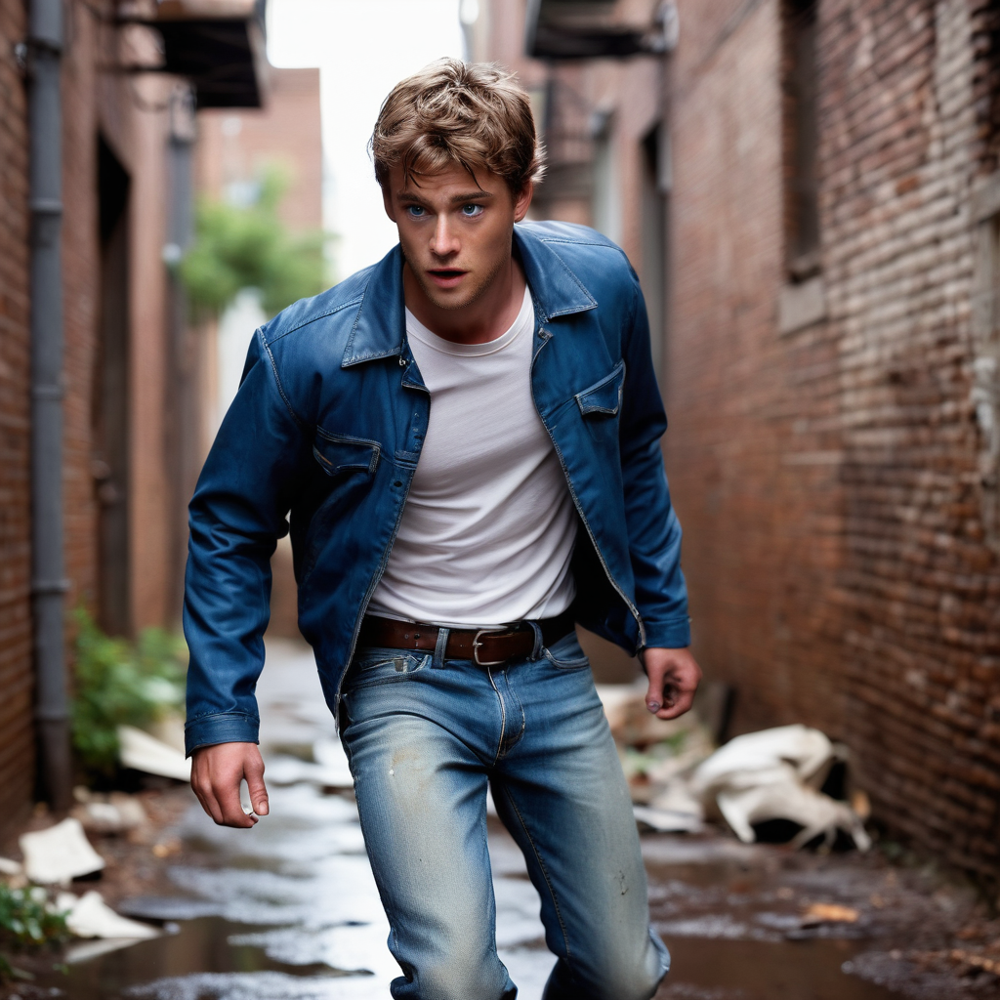

Jake's brown hair was mussed, his blue eyes scanning the surroundings frantically as he ran through the dimly lit back alley. The bat still clutched in one hand, his tall and athletic frame moved swiftly as he sprinted toward a rusty truck parked at the end of the alley. His blue leather jacket was gone now, but beneath it, his white shirt hung in tattered strips from the sleeves. Blue jeans hugged his legs tightly as he leapt into the driver's seat, slamming the door shut behind him.


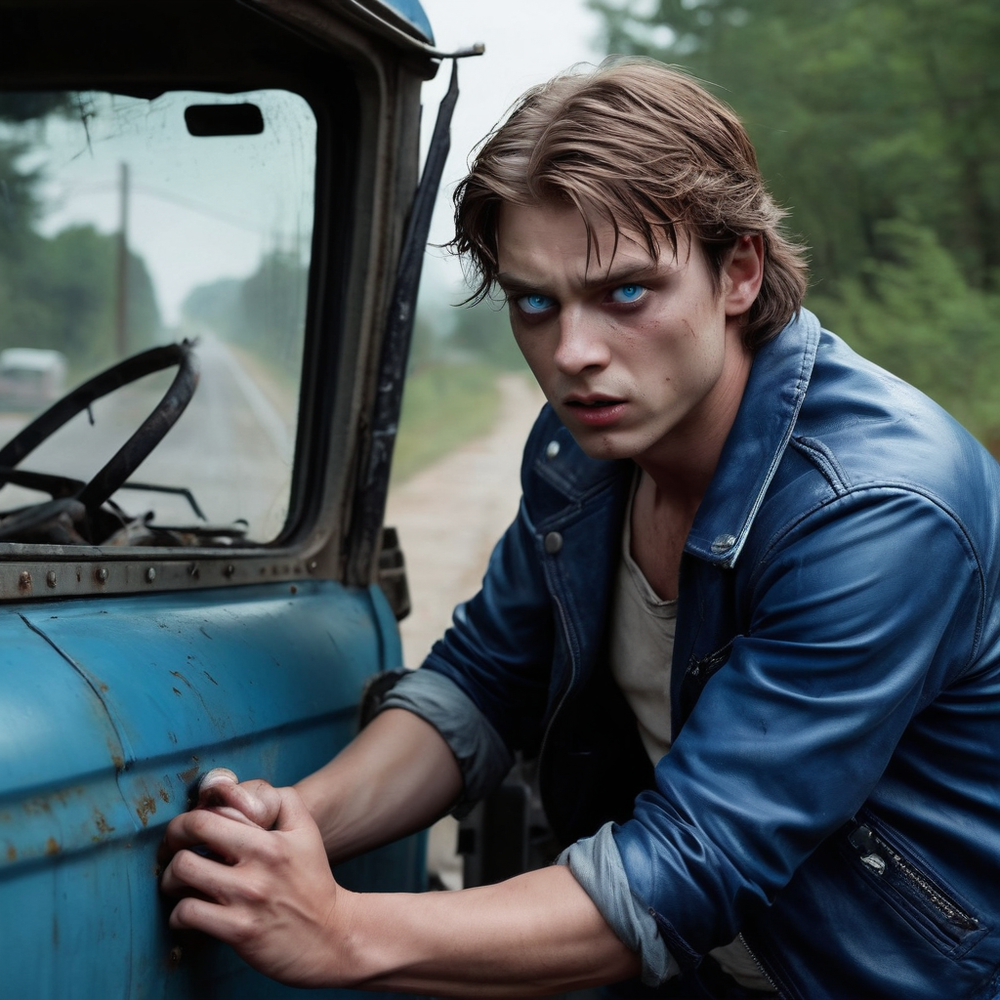

Jake jumps into the truck, slamming the blue leather jacket-clad chest against the driver's side door. His brown hair is mussed from the previous encounter, but a few stray strands still cling to his forehead as he looks back at the zombies closing in, his grip still tight on the trusty baseball bat in one hand and the steering wheel with the other. His piercing blue eyes scan the road ahead before focusing back on the growing horde, his jaw clenched in determination. He drives off into the night, the undead disappearing in the rearview mirror as he navigates the truck down a deserted highway.


In [34]:
# ComfyUI configuration
comfyui_server_address = "buas4.edirlei.com"
comfyui_juggernaut_xl_workflow_path = "./workflow_juggernaut_xl.json"
comfyui_client_id = str(uuid.uuid4())
comfyui_username = "adsai"
comfyui_password = "uuUP4whjX29cF3cxwrX3SY5Mm9TmtASkdgpaNCTHZ9"
comfyui_credentials = base64.b64encode(f"{comfyui_username}:{comfyui_password}".encode('utf-8')).decode('utf-8')
comfyui_auth_header = f"Basic {comfyui_credentials}"

# Helper functions for ComfyUI interactions
def comfyui_queue_prompt(prompt):
    p = {"prompt": prompt, "client_id": comfyui_client_id}
    data = json.dumps(p).encode('utf-8')
    req = urllib.request.Request(f"http://{comfyui_server_address}/prompt", data=data, headers={"Authorization": comfyui_auth_header})
    return json.loads(urllib.request.urlopen(req).read())

def comfyui_get_image(filename, subfolder, folder_type):
    data = {"filename": filename, "subfolder": subfolder, "type": folder_type}
    url_values = urllib.parse.urlencode(data)
    req = urllib.request.Request(f"http://{comfyui_server_address}/view?{url_values}", headers={"Authorization": comfyui_auth_header})
    with urllib.request.urlopen(req) as response:
        return response.read()


def comfyui_get_history(prompt_id):
    req = urllib.request.Request(f"http://{comfyui_server_address}/history/{prompt_id}", headers = {"Authorization": comfyui_auth_header})
    with urllib.request.urlopen(req) as response:
        return json.loads(response.read())

def comfyui_get_images(ws, prompt):
    prompt_id = comfyui_queue_prompt(prompt)['prompt_id']
    output_images = {}
    while True:
        out = ws.recv()
        if isinstance(out, str):
            message = json.loads(out)
            if message['type'] == 'executing':
                data = message['data']
                if data['node'] is None and data['prompt_id'] == prompt_id:
                    break 
        else:
            continue

    history = comfyui_get_history(prompt_id)[prompt_id]
    for o in history['outputs']:
        for node_id in history['outputs']:
            node_output = history['outputs'][node_id]
            if 'images' in node_output:
                images_output = []
                for image in node_output['images']:
                    image_data = comfyui_get_image(image['filename'], image['subfolder'], image['type'])
                    images_output.append(image_data)
            output_images[node_id] = images_output
    return output_images

def comfyui_generate_image_juggernaut_xl(prompt, negative_prompt, seed, output_filename):
    with open(comfyui_juggernaut_xl_workflow_path, "r") as file:
        workflowdata = json.load(file)
    if seed == -1:
        seed = random.randint(0, 2**32 - 1)
    workflowdata["6"]["inputs"]["text"] = prompt
    workflowdata["7"]["inputs"]["text"] = negative_prompt    
    workflowdata["3"]["inputs"]["seed"] = seed
    ws = websocket.WebSocket()
    ws.connect("ws://{}/ws?clientId={}".format(comfyui_server_address, comfyui_client_id), header={"Authorization": comfyui_auth_header})
    images = comfyui_get_images(ws, workflowdata)
    if len(images) > 0:
        bytestream = io.BytesIO(images["9"][0])
        with open(output_filename, "wb") as outfile:
            outfile.write(bytestream.getbuffer())

# Generate and display images for each scene
rnd_story_id = random.randint(1, 9999)
os.makedirs("./images", exist_ok=True)

for i, prompt in enumerate(story_1_improved):
    output_filename = f"./images/story_{rnd_story_id}_scene_{i + 1}.png"
    comfyui_generate_image_juggernaut_xl(prompt, "", -1, output_filename)
    display(Image(filename=output_filename, width=400))
    print(prompt)


This solution integrates ComfyUI and helper functions to ensure character consistency across AI-generated images. First, we set up ComfyUI server credentials and the workflow file path. This configuration enables secure access to the server for image generation tasks. We then define helper functions to interact with the server: comfyui_queue_prompt sends a prompt to initiate image generation, comfyui_get_image retrieves a specific image, and comfyui_get_history accesses the generation history for tracking purposes. Additionally, comfyui_get_images establishes a WebSocket connection to fetch all images for a prompt.

The main image generation function, comfyui_generate_image_juggernaut_xl, loads the workflow file and updates it with the prompt and seed values. It connects to ComfyUI via WebSocket to execute the workflow and save the generated image. Finally, a loop iterates through each enhanced scene description to generate, save, and display images, ensuring consistent character portrayal across scenes. This comprehensive approach leverages refined prompts, controlled settings, and secure server interactions to achieve cohesive and consistent character images across various scenes.

## 5. Results and Discussion

The results were as follows. At first it was really bad, now it is ok. The results finally give me the correct characteristics throughout the scenes. In return, the scene itself has less ligtning and complex background around it.

To make these results, it was a lot of trial and error. it took multiple attempts to make the character consistent throughout the scenes. Olloma gave me that freedom, but it made it really hard.

It worked well to rewrite characteristics of the character in the scene. But I also needed to add the characteristics myself in the prompt. if I did not, even if I said that I wanted consistency, It would give me different characteristics per scene. I also needed to ad the clothing for the character. If I did not, it would make different clothes every scene.
What did not help was asking for the sort of clothing, like 'leather' jacket or fabric of the pants. The color did help. What also was not a big succes was saying to add the gender to the prompt. this would try to guess the gender and if it guesses it 5 times, it would 50% out of the time be wrong for some reason. This means that the only things I needed to rewrite was the phisical characteristics, clothing and color. that worked the best and would give me the best solution to character consistency. 

With these rewritten scenes, it would make ai pictures that are consistent throughout the whole story.

To see my results throughout this project, click here to see my generations on my github page:

https://github.com/DaanQuaadvliet231146/DaanQuaadvliet.Challenges/tree/main/Generative_AI_Year2/images 


## 6. Conclusions

The solution achieved character consistency by refining prompts to specify detailed physical attributes, clothing, and colors, minimizing unintended variations. Simplifying scenes and reducing lighting complexity also helped. Ollama’s flexibility required careful prompt engineering, focusing on specific traits to maintain a cohesive and recognizable character across all scenes. 

Overall I am happy with this project. Mainly by researching what I needed to do and what challenges were across this project made it a hard, but fun challenge. I am happy with my conclusion, because of the research I did in image generation, by watching every video recommended, reading every article, learning about LoRa and ControlNet, even though I did not use it. and learning about character consistency overall. I am moderately happy about my results. I wanted to also make the background more complex, but I could not get that to work. That is what is probably a good future step to work towards.



#### Challenges of Developing the Solution

The main challenges in developing this solution were ensuring consistent character portrayal across varied scenes and managing integration with Ollama. creating detailed, refined prompts that balanced scene uniqueness with character consistency required experimentation with Ollama’s prompt structure.

#### Limitations of the Solution
While the solution successfully generates images with improved consistency, it has some limitations. The reliance on prompt-based descriptions for consistency can lead to minor variations, as AI-generated images may not precisely replicate details across scenes. Additionally, fine-tuning was restricted to prompt adjustments without direct control over the model architecture or training data, limiting precision. Lastly, handling complex backgrounds or lighting variations is challenging, as these factors can impact how the character appears in different contexts.

#### Future Steps for Improvement
To further enhance consistency, future steps could include exploring ControlNet or LoRA models within ComfyUI, which could provide finer control over poses, expressions, and character details across scenes. Training a custom model specifically for the target character would also help maintain uniformity in appearance. Improving prompt engineering techniques and adding feedback loops to dynamically adjust prompts based on generated images could enhance refinement. Additionally, testing different generation parameters and experimenting with multiple seeds could help achieve even greater consistency in visual style and character portrayal.


#### Document my time

To evidence my effort, I made this part of the notebook, in which I tell what I all did these last 2 weeks on working towards this end goal:

First I read the whole document send by our mentor, clicked on every link and read all links:
Section 2 I read all links and watched the videos except the last one, because it was 3 hours long.
From Section 4 I read the Stable Diffusion XL Base + Turbo + AbsoluteReality + Anything XL. The other ones were not really interesting. 

After Reading the whole PDF I did research on the notebooks sent. I ran all three and after that did a lot of research on Ollama, which was the one I wanted to use to make my images more consistent.

After doing this I Did research on LoRa, which did not go well, I understand what it is and how it works, but I did not know how to implement it in VSCode after some time (I wanted to use this one: https://civitai.com/models/561630/the-ponydex-pokemon-pony-xl-or-indigo-xl, because it looked interesting). I also tried to use the direct link to comfyui to make some practice models, but I still did not know what it had to do with the challenge. Only after using the vscode notebook 4 I understood it.

After doing some more research on Prompt-based solutions, I finally understood what to do this block, I needed to make characters more consistant in the images, using a code that rewrites the story to a more consistent level. I finally began to do more research on Ollama, which helped me to my end goal.

After all this I began on my final notebook. which I began with using alloma to make my characters more consistant. I tried to use different prompts to trial and error to see what worked best. I also researched on the code that was already in the template, to know what it meant. After all of this I finished my notebook and challange.
Overall It was a lot of time doing research on the challange and learning what generative AI really was and then some time invested in making the notebook.

